In [1]:


import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))


<h1>Import necessary libraries for the project</h1>

In [2]:

import matplotlib.pyplot as plt # for plotting images
import tensorflow as tf # for building deep learning models
import seaborn as sns # for visualizing data
import random # for generating random numbers
from PIL import Image # for opening and manipulating images
from tensorflow.keras.preprocessing import image # for preprocessing images
from tensorflow.keras.applications.inception_v3 import InceptionV3 # for using pre-trained InceptionV3 model
from tensorflow.keras import Sequential, Model # for building sequential and functional models
from keras.layers import (Conv2D, MaxPooling2D, Dense, Flatten,
Dropout, Input,GlobalAveragePooling2D,BatchNormalization) # for adding different layers to the models
from tensorflow.keras.activations import softmax # for applying softmax activation function to the output layer
from tensorflow.keras.optimizers import Adam # for using Adam optimizer
from keras.preprocessing.image import ImageDataGenerator # for data augmentation and preprocessing
from mpl_toolkits.axes_grid1 import ImageGrid # for plotting images in a grid
from keras.models import Model # for building functional models
from keras.applications.vgg16 import VGG16, preprocess_input # for using pre-trained VGG16 model and preprocessing input data
from keras.callbacks import ModelCheckpoint, EarlyStopping # for saving model weights and early stopping
from sklearn.metrics import (ConfusionMatrixDisplay, confusion_matrix,
accuracy_score) # for computing and displaying confusion matrix and accuracy score
import cv2 # for image processing and computer vision tasks

In [3]:
import warnings # supress warnings
warnings.filterwarnings('ignore')

In [4]:
# Create a list of folder names to be used later for loading images

our_folders = ['Acne and Rosacea Photos', \
              'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions', \
              'Melanoma Skin Cancer Nevi and Moles', \
              'Vasculitis Photos', \
              'Hair Loss Photos Alopecia and other Hair Diseases'
              ]

In [5]:
root_dir =  r'C:\Users\azizo\Desktop\a\train'

In [6]:
test_dir = r'C:\Users\azizo\Desktop\a\test'

In [7]:
acne_train_path = os.path.join(root_dir,'Acne and Rosacea Photos')
actinic_train_path = os.path.join(root_dir, 'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions')
melonama_train_path = os.path.join(root_dir, 'Melanoma Skin Cancer Nevi and Moles')
vasculitis_train_path = os.path.join(root_dir, 'Vasculitis Photos')
Hair_train_path = os.path.join(root_dir, 'Hair Loss Photos Alopecia and other Hair Diseases')

In [8]:
acne_test_path = os.path.join(test_dir,'Acne and Rosacea Photos')
actinic_test_path = os.path.join(test_dir, 'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions')
melonama_test_path = os.path.join(test_dir, 'Melanoma Skin Cancer Nevi and Moles')
vasculitis_test_path = os.path.join(test_dir, 'Vasculitis Photos')
Hair_test_path = os.path.join(test_dir, 'Hair Loss Photos Alopecia and other Hair Diseases')



actinic_test_files = ([files_ for _, _, files_ in os.walk(actinic_test_path)])[0]
acne_test_files = ([files_ for _, _, files_ in os.walk(acne_test_path)])[0]
melonama_test_files = ([files_ for _, _, files_ in os.walk(melonama_test_path)])[0]
vasculitis_test_files = ([files_ for _, _, files_ in os.walk(vasculitis_test_path)])[0]
Hair_test_files = ([files_ for _, _, files_ in os.walk(Hair_test_path)])[0]

In [9]:
train_dirs = [] # create an empty list to store the directory paths of training images

# loop over the list of folder names
for i in our_folders:
    
    # loop over the directories and their subdirectories in the folder
    for folder_,_, files_ in os.walk(f'input/train/{i}'):
        
        print(folder_) # print the directory path
        train_dirs.append(folder_) # add the directory path to the list

In [10]:
#Get all image files in each train directory
actinic_train_files = ([files_ for _, _, files_ in os.walk(actinic_train_path)])[0]
acne_train_files = ([files_ for _, _, files_ in os.walk(acne_train_path)])[0]
melonama_train_files = ([files_ for _, _, files_ in os.walk(melonama_train_path)])[0]
vasculitis_train_files = ([files_ for _, _, files_ in os.walk(vasculitis_train_path)])[0]
Hair_train_files = ([files_ for _, _, files_ in os.walk(Hair_train_path)])[0]

In [11]:
# Define a function for plotting a grid of images for a given folder and its files
def plotGridImages(d_name, list_files, train_path, nrows=1, ncols=5):
    # Create a figure with subplots arranged in a grid
    fig = plt.figure(1, figsize=(30, 30))
    grid = ImageGrid(fig, 111, nrows_ncols=(nrows, ncols), axes_pad=0.05)
    # Print the name of the folder for which the images are being displayed
    print(f"{d_name}")
    # Loop over a random sample of files from the folder
    for i, img_id in enumerate(random.sample(list_files, ncols)):
        # Get the image and its path
        ax = grid[i]
        image_dir_path = os.path.join(train_path, img_id)
        img = image.load_img(image_dir_path, (224, 224))
        img = image.img_to_array(img)
        # Show the image in the subplot
        ax.imshow(img / 255.)
        # Add text to the subplot indicating the label of the image
        ax.text(10, 200, 'LABEL: %s' % d_name, color='k', backgroundcolor='w', alpha=0.8)
        ax.axis('off')
    # Display the grid of images
    plt.show()

Actinic


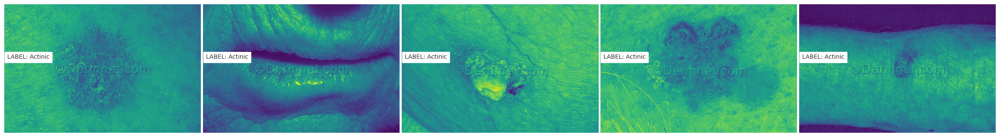

In [12]:
plotGridImages('Actinic',actinic_train_files, actinic_train_path,ncols=5)

Acne


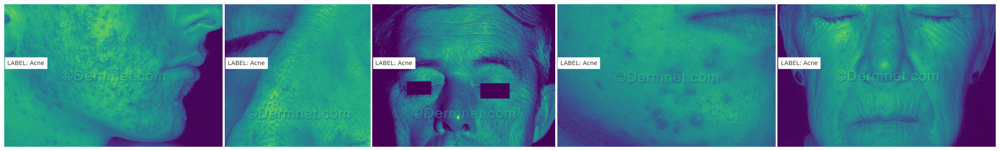

In [13]:
plotGridImages('Acne',acne_train_files, acne_train_path,ncols=5)

Melonama


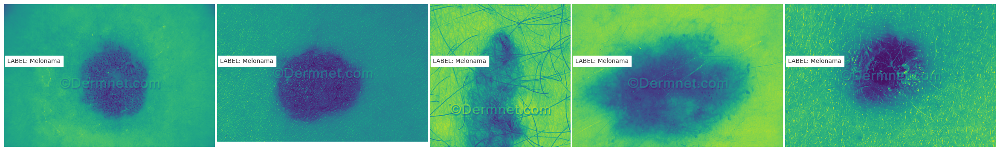

In [14]:
plotGridImages('Melonama',melonama_train_files, melonama_train_path,ncols=5)

Vasculitis


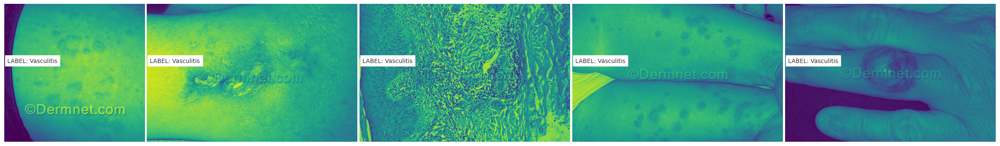

In [15]:
plotGridImages('Vasculitis',vasculitis_train_files, vasculitis_train_path,ncols=5)

Hair


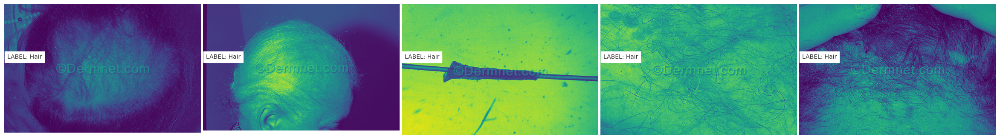

In [16]:
plotGridImages('Hair',Hair_train_files, Hair_train_path,ncols=5)

# DataFrame Creation 

In [17]:
final_df = pd.DataFrame()

In [18]:
actinic_df = pd.DataFrame()
actinic_df['Image'] =  [actinic_train_path+'/'+img for img in actinic_train_files]
actinic_df['Label'] = "actinic"

In [19]:
actinic_df.shape

(1149, 2)

In [20]:
melonama_df = pd.DataFrame()
melonama_df['Image'] = [melonama_train_path+'/'+img for img in melonama_train_files]
melonama_df['Label'] = "melonama"

In [21]:
melonama_df.shape

(463, 2)

In [22]:
acne_df = pd.DataFrame()
acne_df['Image'] =  [acne_train_path+'/'+img for img in acne_train_files]
acne_df['Label'] = "acne"

In [23]:
acne_df.shape

(840, 2)

In [24]:
vasculitis_df = pd.DataFrame()
vasculitis_df['Image'] =  [vasculitis_train_path+'/'+img for img in vasculitis_train_files]
vasculitis_df['Label'] = "vasculitis"

In [25]:
vasculitis_df.shape

(416, 2)

In [26]:
HairLoss_df = pd.DataFrame()
HairLoss_df['Image'] =  [Hair_train_path+'/'+img for img in Hair_train_files]
HairLoss_df['Label'] = "HairLoss"

In [27]:
HairLoss_df.shape

(239, 2)

In [28]:
final_df = pd.concat([actinic_df, melonama_df, acne_df, vasculitis_df, HairLoss_df], ignore_index=True)


In [29]:
final_df = pd.DataFrame(final_df)


In [30]:

#final_df = final_df.append([actinic_df, melonama_df, acne_df, vasculitis_df, HairLoss_df], ignore_index=True)


In [31]:
final_df.shape

(3107, 2)

In [32]:
final_df.head(3)

,Image,Label
0,C:\Users\azizo\Desktop\a\train\Actinic Keratos...,actinic
1,C:\Users\azizo\Desktop\a\train\Actinic Keratos...,actinic
2,C:\Users\azizo\Desktop\a\train\Actinic Keratos...,actinic


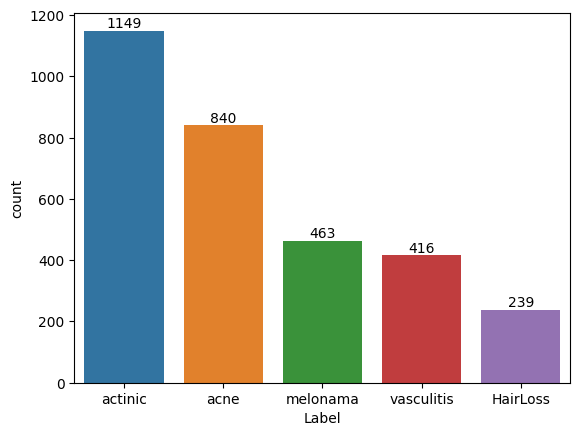

In [33]:
ax = sns.countplot(x=final_df['Label'],
                   order=final_df['Label'].value_counts(ascending=False).index);

abs_values = final_df['Label'].value_counts(ascending=False).values

ax.bar_label(container=ax.containers[0], labels=abs_values);

In [34]:
final_test_df = pd.DataFrame()
################# melonama #########

melonama_test_df = pd.DataFrame()
melonama_test_df['Image'] = [melonama_test_path+'/'+img for img in melonama_test_files]
melonama_test_df['Label'] = "melonama"

##################  actinic  ##########

actinic_test_df = pd.DataFrame()
actinic_test_df['Image'] =  [actinic_test_path+'/'+img for img in actinic_test_files]
actinic_test_df['Label'] = "actinic"

################  acne  ##########

acne_test_df = pd.DataFrame()
acne_test_df['Image'] =  [acne_test_path+'/'+img for img in acne_test_files]
acne_test_df['Label'] = "acne"

###########################################

vasculitis_test_df = pd.DataFrame()
vasculitis_test_df['Image'] =  [vasculitis_test_path+'/'+img for img in vasculitis_test_files]
vasculitis_test_df['Label'] = "vasculitis"

###########################################

HairLoss_test_df = pd.DataFrame()
HairLoss_test_df['Image'] =  [Hair_test_path+'/'+img for img in Hair_test_files]
HairLoss_test_df['Label'] = "HairLoss"

###########################################
print(type(final_test_df))

final_test_df = pd.concat([final_test_df, actinic_test_df, melonama_test_df, acne_test_df, vasculitis_test_df, HairLoss_test_df], ignore_index=True)


final_test_df.shape

<class 'pandas.core.frame.DataFrame'>


(881, 2)

In [35]:
train_data_gen  = ImageDataGenerator(
                                    rescale=1 / 255.0,
                                    rotation_range=40,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    horizontal_flip = True,
                                    vertical_flip = True,
                                    validation_split=0.2,
                                    fill_mode='nearest')
test_data_gen = ImageDataGenerator(rescale=1 / 255.0)

In [36]:
# Define the batch size
batch_size = 32

# Create a training data generator
train_generator = train_data_gen.flow_from_dataframe(
    dataframe=final_df,        # The DataFrame containing the training data
    x_col="Image",             # The name of the column containing the image file names
    y_col="Label",             # The name of the column containing the labels
    target_size=(224, 224),    # The size to which the images will be resized
    batch_size=batch_size,     # The batch size
    class_mode="categorical",  # The type of classification (categorical or sparse)
    subset='training',         # The subset of the data to use (training or validation)
    shuffle=True,              # Whether to shuffle the data
    seed=42                    # The seed for the random number generator
)

# Create a validation data generator
valid_generator = train_data_gen.flow_from_dataframe(
    dataframe=final_df,        # The DataFrame containing the validation data
    x_col="Image",             # The name of the column containing the image file names
    y_col="Label",             # The name of the column containing the labels
    target_size=(224, 224),    # The size to which the images will be resized
    batch_size=batch_size,     # The batch size
    class_mode="categorical",  # The type of classification (categorical or sparse)
    subset='validation',       # The subset of the data to use (training or validation)
    shuffle=True,              # Whether to shuffle the data
    seed=42                    # The seed for the random number generator
)

# Create a test data generator
test_generator = test_data_gen.flow_from_dataframe(
    dataframe=final_test_df,   # The DataFrame containing the test data
    x_col="Image",             # The name of the column containing the image file names
    y_col="Label",             # The name of the column containing the labels
    target_size=(224, 224),    # The size to which the images will be resized
    batch_size=1,              # The batch size
    class_mode='categorical',  # The type of classification (categorical or sparse)
    shuffle=False,             # Whether to shuffle the data
)

Found 2486 validated image filenames belonging to 5 classes.
Found 621 validated image filenames belonging to 5 classes.
Found 881 validated image filenames belonging to 5 classes.


In [37]:
# Importing Xception model from Keras applications
from tensorflow.keras.applications import Xception

# Load the Xception model trained on ImageNet dataset and exclude the last (top) layers
res = Xception(weights ='imagenet', include_top = False, input_shape = (224, 224, 3)) 

# Set the trainable parameter to False to freeze the weights of the loaded layers
res.trainable = False

# Creating new layers on top of the loaded model
x = res.output  # Output from the loaded Xception model is used as input to the new layers
x = GlobalAveragePooling2D()(x)  # Global Average Pooling layer reduces the dimensions of the input
x = BatchNormalization()(x)  # Batch Normalization layer normalizes the inputs to speed up training
x = Dropout(0.5)(x)  # Dropout layer randomly drops a fraction of the input units to prevent overfitting
x = Dense(512, activation ='relu')(x)  # Fully connected Dense layer with 512 output units and ReLU activation
x = BatchNormalization()(x)
x = Dropout(0.5)(x) 
x = Dense(256, activation ='relu')(x)  # Fully connected Dense layer with 256 output units and ReLU activation
x = BatchNormalization()(x)
x = Dense(5, activation ='softmax')(x)  # Final fully connected Dense layer with 5 output units and Softmax activation for classification

# Creating a Keras model by specifying the input and output layers
model = Model(res.input, x)

# Compiling the model by specifying the optimizer, loss function and evaluation metric
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.001),
              loss ="categorical_crossentropy",
              metrics =["categorical_accuracy"])

# Printing the summary of the model, showing the layers and their shapes
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 111, 111, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                                             

 block4_sepconv1_bn (BatchNorma  (None, 28, 28, 728)  2912       ['block4_sepconv1[0][0]']        
 lization)                                                                                        
                                                                                                  
 block4_sepconv2_act (Activatio  (None, 28, 28, 728)  0          ['block4_sepconv1_bn[0][0]']     
 n)                                                                                               
                                                                                                  
 block4_sepconv2 (SeparableConv  (None, 28, 28, 728)  536536     ['block4_sepconv2_act[0][0]']    
 2D)                                                                                              
                                                                                                  
 block4_sepconv2_bn (BatchNorma  (None, 28, 28, 728)  2912       ['block4_sepconv2[0][0]']        
 lization)

 n)                                                                                               
                                                                                                  
 block7_sepconv1 (SeparableConv  (None, 14, 14, 728)  536536     ['block7_sepconv1_act[0][0]']    
 2D)                                                                                              
                                                                                                  
 block7_sepconv1_bn (BatchNorma  (None, 14, 14, 728)  2912       ['block7_sepconv1[0][0]']        
 lization)                                                                                        
                                                                                                  
 block7_sepconv2_act (Activatio  (None, 14, 14, 728)  0          ['block7_sepconv1_bn[0][0]']     
 n)                                                                                               
          

 block9_sepconv3_bn (BatchNorma  (None, 14, 14, 728)  2912       ['block9_sepconv3[0][0]']        
 lization)                                                                                        
                                                                                                  
 add_7 (Add)                    (None, 14, 14, 728)  0           ['block9_sepconv3_bn[0][0]',     
                                                                  'add_6[0][0]']                  
                                                                                                  
 block10_sepconv1_act (Activati  (None, 14, 14, 728)  0          ['add_7[0][0]']                  
 on)                                                                                              
                                                                                                  
 block10_sepconv1 (SeparableCon  (None, 14, 14, 728)  536536     ['block10_sepconv1_act[0][0]']   
 v2D)     

                                                                                                  
 block12_sepconv3_act (Activati  (None, 14, 14, 728)  0          ['block12_sepconv2_bn[0][0]']    
 on)                                                                                              
                                                                                                  
 block12_sepconv3 (SeparableCon  (None, 14, 14, 728)  536536     ['block12_sepconv3_act[0][0]']   
 v2D)                                                                                             
                                                                                                  
 block12_sepconv3_bn (BatchNorm  (None, 14, 14, 728)  2912       ['block12_sepconv3[0][0]']       
 alization)                                                                                       
                                                                                                  
 add_10 (A

__________________________________________________________________________________________________


In [38]:
custom_early_stopping = EarlyStopping(
    monitor='val_loss', 
    patience=10, 
    min_delta=0.001, 
    mode='min'
)

In [39]:
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)
tf.compat.v1.keras.backend.set_session(session)

In [40]:
class CustomEarlyStopping(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if logs['val_loss'] > 0.5:
            print("Stopping training because validation loss is too high")
            self.model.stop_training = True

In [41]:
early_stopping = EarlyStopping(monitor='val_loss', restore_best_weights=True)

history = model.fit(train_generator, 
                    epochs=500, 
                    validation_data=valid_generator,
                    #callbacks=[early_stopping]
                   )

Epoch 1/500
78/78 [==============================] - 31s 347ms/step - loss: 1.5096 - categorical_accuracy: 0.4871 - val_loss: 1.2335 - val_categorical_accuracy: 0.4300
Epoch 2/500
78/78 [==============================] - 29s 365ms/step - loss: 1.1536 - categorical_accuracy: 0.5933 - val_loss: 1.4977 - val_categorical_accuracy: 0.3011
Epoch 3/500
78/78 [==============================] - 30s 380ms/step - loss: 1.0784 - categorical_accuracy: 0.6078 - val_loss: 1.3233 - val_categorical_accuracy: 0.4525
Epoch 4/500
78/78 [==============================] - 26s 339ms/step - loss: 1.0070 - categorical_accuracy: 0.6303 - val_loss: 1.1635 - val_categorical_accuracy: 0.5185
Epoch 5/500
78/78 [==============================] - 27s 346ms/step - loss: 0.9515 - categorical_accuracy: 0.6456 - val_loss: 1.3447 - val_categorical_accuracy: 0.3977
Epoch 6/500
78/78 [==============================] - 28s 363ms/step - loss: 0.9146 - categorical_accuracy: 0.6617 - val_loss: 1.2395 - val_categorical_accuracy:

78/78 [==============================] - 25s 318ms/step - loss: 0.6432 - categorical_accuracy: 0.7534 - val_loss: 1.0509 - val_categorical_accuracy: 0.5765
Epoch 50/500
78/78 [==============================] - 25s 321ms/step - loss: 0.6492 - categorical_accuracy: 0.7599 - val_loss: 1.1378 - val_categorical_accuracy: 0.5539
Epoch 51/500
78/78 [==============================] - 25s 317ms/step - loss: 0.6399 - categorical_accuracy: 0.7586 - val_loss: 1.2961 - val_categorical_accuracy: 0.5008
Epoch 52/500
78/78 [==============================] - 25s 318ms/step - loss: 0.6455 - categorical_accuracy: 0.7607 - val_loss: 1.1608 - val_categorical_accuracy: 0.5282
Epoch 53/500
78/78 [==============================] - 25s 321ms/step - loss: 0.6408 - categorical_accuracy: 0.7591 - val_loss: 1.2203 - val_categorical_accuracy: 0.5024
Epoch 54/500
78/78 [==============================] - 25s 313ms/step - loss: 0.6293 - categorical_accuracy: 0.7635 - val_loss: 1.1517 - val_categorical_accuracy: 0.5427

78/78 [==============================] - 26s 330ms/step - loss: 0.5169 - categorical_accuracy: 0.8158 - val_loss: 1.1695 - val_categorical_accuracy: 0.5523
Epoch 98/500
78/78 [==============================] - 29s 369ms/step - loss: 0.5325 - categorical_accuracy: 0.8093 - val_loss: 1.1352 - val_categorical_accuracy: 0.5813
Epoch 99/500
78/78 [==============================] - 26s 329ms/step - loss: 0.5128 - categorical_accuracy: 0.8029 - val_loss: 1.2242 - val_categorical_accuracy: 0.5362
Epoch 100/500
78/78 [==============================] - 26s 330ms/step - loss: 0.5722 - categorical_accuracy: 0.7896 - val_loss: 1.1132 - val_categorical_accuracy: 0.5604
Epoch 101/500
78/78 [==============================] - 27s 344ms/step - loss: 0.5439 - categorical_accuracy: 0.7920 - val_loss: 1.1260 - val_categorical_accuracy: 0.5411
Epoch 102/500
78/78 [==============================] - 25s 325ms/step - loss: 0.5488 - categorical_accuracy: 0.8001 - val_loss: 1.3227 - val_categorical_accuracy: 0.4

78/78 [==============================] - 32s 404ms/step - loss: 0.5016 - categorical_accuracy: 0.8166 - val_loss: 1.2796 - val_categorical_accuracy: 0.5201
Epoch 146/500
78/78 [==============================] - 29s 368ms/step - loss: 0.4804 - categorical_accuracy: 0.8134 - val_loss: 1.1727 - val_categorical_accuracy: 0.5491
Epoch 147/500
78/78 [==============================] - 28s 364ms/step - loss: 0.4861 - categorical_accuracy: 0.8162 - val_loss: 1.2263 - val_categorical_accuracy: 0.5427
Epoch 148/500
78/78 [==============================] - 29s 374ms/step - loss: 0.4607 - categorical_accuracy: 0.8327 - val_loss: 1.2550 - val_categorical_accuracy: 0.5298
Epoch 149/500
78/78 [==============================] - 28s 364ms/step - loss: 0.5069 - categorical_accuracy: 0.8158 - val_loss: 1.2027 - val_categorical_accuracy: 0.5459
Epoch 150/500
78/78 [==============================] - 32s 409ms/step - loss: 0.5316 - categorical_accuracy: 0.8049 - val_loss: 1.3409 - val_categorical_accuracy: 0

78/78 [==============================] - 26s 327ms/step - loss: 0.4559 - categorical_accuracy: 0.8327 - val_loss: 1.1458 - val_categorical_accuracy: 0.5878
Epoch 194/500
78/78 [==============================] - 26s 332ms/step - loss: 0.4583 - categorical_accuracy: 0.8359 - val_loss: 1.2619 - val_categorical_accuracy: 0.5604
Epoch 195/500
78/78 [==============================] - 26s 336ms/step - loss: 0.4572 - categorical_accuracy: 0.8230 - val_loss: 1.2416 - val_categorical_accuracy: 0.5427
Epoch 196/500
78/78 [==============================] - 27s 349ms/step - loss: 0.4484 - categorical_accuracy: 0.8375 - val_loss: 1.2662 - val_categorical_accuracy: 0.5411
Epoch 197/500
78/78 [==============================] - 27s 343ms/step - loss: 0.4294 - categorical_accuracy: 0.8359 - val_loss: 1.2066 - val_categorical_accuracy: 0.5829
Epoch 198/500
78/78 [==============================] - 31s 396ms/step - loss: 0.4616 - categorical_accuracy: 0.8198 - val_loss: 1.2799 - val_categorical_accuracy: 0

78/78 [==============================] - 24s 311ms/step - loss: 0.4279 - categorical_accuracy: 0.8447 - val_loss: 1.4017 - val_categorical_accuracy: 0.5089
Epoch 242/500
78/78 [==============================] - 24s 307ms/step - loss: 0.4214 - categorical_accuracy: 0.8463 - val_loss: 1.2666 - val_categorical_accuracy: 0.5475
Epoch 243/500
78/78 [==============================] - 24s 311ms/step - loss: 0.4282 - categorical_accuracy: 0.8407 - val_loss: 1.2574 - val_categorical_accuracy: 0.5314
Epoch 244/500
78/78 [==============================] - 24s 309ms/step - loss: 0.4335 - categorical_accuracy: 0.8403 - val_loss: 1.2734 - val_categorical_accuracy: 0.5572
Epoch 245/500
78/78 [==============================] - 24s 309ms/step - loss: 0.4052 - categorical_accuracy: 0.8516 - val_loss: 1.1816 - val_categorical_accuracy: 0.5845
Epoch 246/500
78/78 [==============================] - 24s 309ms/step - loss: 0.4418 - categorical_accuracy: 0.8347 - val_loss: 1.2000 - val_categorical_accuracy: 0

78/78 [==============================] - 25s 320ms/step - loss: 0.4308 - categorical_accuracy: 0.8423 - val_loss: 1.4555 - val_categorical_accuracy: 0.4605
Epoch 290/500
78/78 [==============================] - 24s 310ms/step - loss: 0.4194 - categorical_accuracy: 0.8475 - val_loss: 1.4338 - val_categorical_accuracy: 0.5250
Epoch 291/500
78/78 [==============================] - 29s 366ms/step - loss: 0.4117 - categorical_accuracy: 0.8459 - val_loss: 1.3735 - val_categorical_accuracy: 0.5346
Epoch 292/500
78/78 [==============================] - 27s 347ms/step - loss: 0.3986 - categorical_accuracy: 0.8604 - val_loss: 1.2313 - val_categorical_accuracy: 0.5684
Epoch 293/500
78/78 [==============================] - 27s 351ms/step - loss: 0.4263 - categorical_accuracy: 0.8415 - val_loss: 1.2584 - val_categorical_accuracy: 0.5411
Epoch 294/500
78/78 [==============================] - 27s 349ms/step - loss: 0.4171 - categorical_accuracy: 0.8399 - val_loss: 1.2371 - val_categorical_accuracy: 0

78/78 [==============================] - 24s 310ms/step - loss: 0.3659 - categorical_accuracy: 0.8737 - val_loss: 1.2464 - val_categorical_accuracy: 0.5620
Epoch 338/500
78/78 [==============================] - 24s 310ms/step - loss: 0.3899 - categorical_accuracy: 0.8580 - val_loss: 1.4301 - val_categorical_accuracy: 0.5346
Epoch 339/500
78/78 [==============================] - 26s 328ms/step - loss: 0.4091 - categorical_accuracy: 0.8488 - val_loss: 1.3600 - val_categorical_accuracy: 0.5427
Epoch 340/500
78/78 [==============================] - 26s 336ms/step - loss: 0.3623 - categorical_accuracy: 0.8644 - val_loss: 1.4611 - val_categorical_accuracy: 0.5072
Epoch 341/500
78/78 [==============================] - 26s 327ms/step - loss: 0.3806 - categorical_accuracy: 0.8544 - val_loss: 1.4555 - val_categorical_accuracy: 0.5121
Epoch 342/500
78/78 [==============================] - 26s 338ms/step - loss: 0.3862 - categorical_accuracy: 0.8520 - val_loss: 1.4716 - val_categorical_accuracy: 0

78/78 [==============================] - 26s 339ms/step - loss: 0.3789 - categorical_accuracy: 0.8665 - val_loss: 1.2728 - val_categorical_accuracy: 0.5700
Epoch 386/500
78/78 [==============================] - 25s 320ms/step - loss: 0.3977 - categorical_accuracy: 0.8471 - val_loss: 1.3903 - val_categorical_accuracy: 0.5346
Epoch 387/500
78/78 [==============================] - 25s 317ms/step - loss: 0.3988 - categorical_accuracy: 0.8548 - val_loss: 1.3814 - val_categorical_accuracy: 0.5298
Epoch 388/500
78/78 [==============================] - 25s 315ms/step - loss: 0.3719 - categorical_accuracy: 0.8540 - val_loss: 1.2587 - val_categorical_accuracy: 0.5829
Epoch 389/500
78/78 [==============================] - 25s 317ms/step - loss: 0.3859 - categorical_accuracy: 0.8588 - val_loss: 1.4097 - val_categorical_accuracy: 0.5250
Epoch 390/500
78/78 [==============================] - 25s 320ms/step - loss: 0.3685 - categorical_accuracy: 0.8693 - val_loss: 1.3706 - val_categorical_accuracy: 0

78/78 [==============================] - 26s 335ms/step - loss: 0.3630 - categorical_accuracy: 0.8628 - val_loss: 1.3995 - val_categorical_accuracy: 0.5266
Epoch 434/500
78/78 [==============================] - 26s 330ms/step - loss: 0.3650 - categorical_accuracy: 0.8673 - val_loss: 1.3403 - val_categorical_accuracy: 0.5491
Epoch 435/500
78/78 [==============================] - 26s 333ms/step - loss: 0.3576 - categorical_accuracy: 0.8729 - val_loss: 1.4041 - val_categorical_accuracy: 0.5395
Epoch 436/500
78/78 [==============================] - 26s 332ms/step - loss: 0.3636 - categorical_accuracy: 0.8665 - val_loss: 1.3027 - val_categorical_accuracy: 0.5588
Epoch 437/500
78/78 [==============================] - 26s 338ms/step - loss: 0.3696 - categorical_accuracy: 0.8648 - val_loss: 1.3202 - val_categorical_accuracy: 0.5749
Epoch 438/500
78/78 [==============================] - 28s 356ms/step - loss: 0.3648 - categorical_accuracy: 0.8600 - val_loss: 1.2622 - val_categorical_accuracy: 0

78/78 [==============================] - 26s 333ms/step - loss: 0.3381 - categorical_accuracy: 0.8829 - val_loss: 1.3560 - val_categorical_accuracy: 0.5652
Epoch 482/500
78/78 [==============================] - 24s 311ms/step - loss: 0.3730 - categorical_accuracy: 0.8673 - val_loss: 1.3014 - val_categorical_accuracy: 0.5845
Epoch 483/500
78/78 [==============================] - 24s 312ms/step - loss: 0.3684 - categorical_accuracy: 0.8669 - val_loss: 1.3795 - val_categorical_accuracy: 0.5845
Epoch 484/500
78/78 [==============================] - 24s 309ms/step - loss: 0.3392 - categorical_accuracy: 0.8785 - val_loss: 1.3838 - val_categorical_accuracy: 0.5604
Epoch 485/500
78/78 [==============================] - 24s 310ms/step - loss: 0.3718 - categorical_accuracy: 0.8612 - val_loss: 1.4698 - val_categorical_accuracy: 0.5008
Epoch 486/500
78/78 [==============================] - 25s 314ms/step - loss: 0.3312 - categorical_accuracy: 0.8785 - val_loss: 1.4573 - val_categorical_accuracy: 0

# Model Visualization

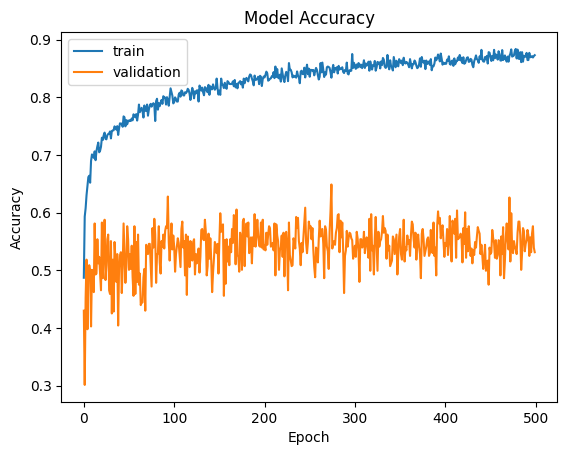

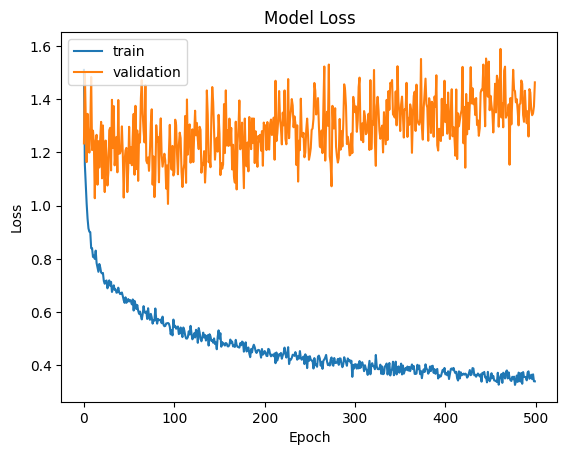

In [42]:
import matplotlib.pyplot as plt

# plot the training and validation accuracy curves
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

# plot the training and validation loss curves
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

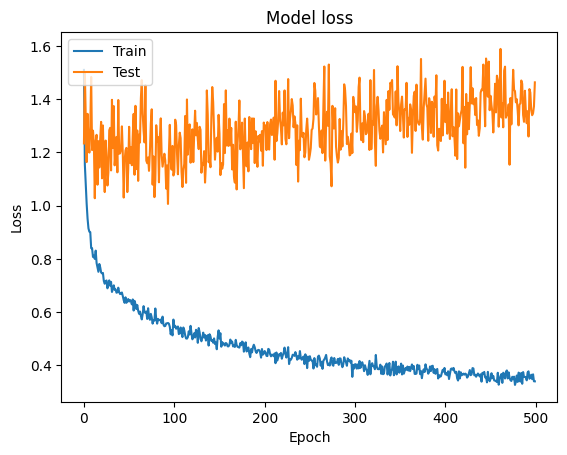

In [43]:
# Plot loss values vs epoch
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

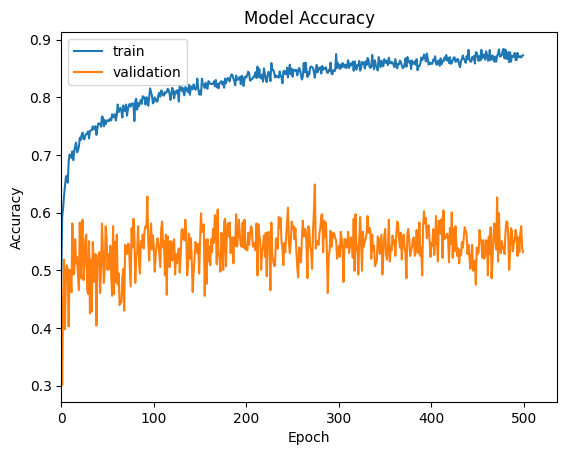

In [44]:
import matplotlib.pyplot as plt

plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.xlim([0, 536])  # Set the x-axis limits to show up to 500 epochs
plt.show()


ConfusionMatrixDisplay

881/881 [==============================] - 7s 6ms/step


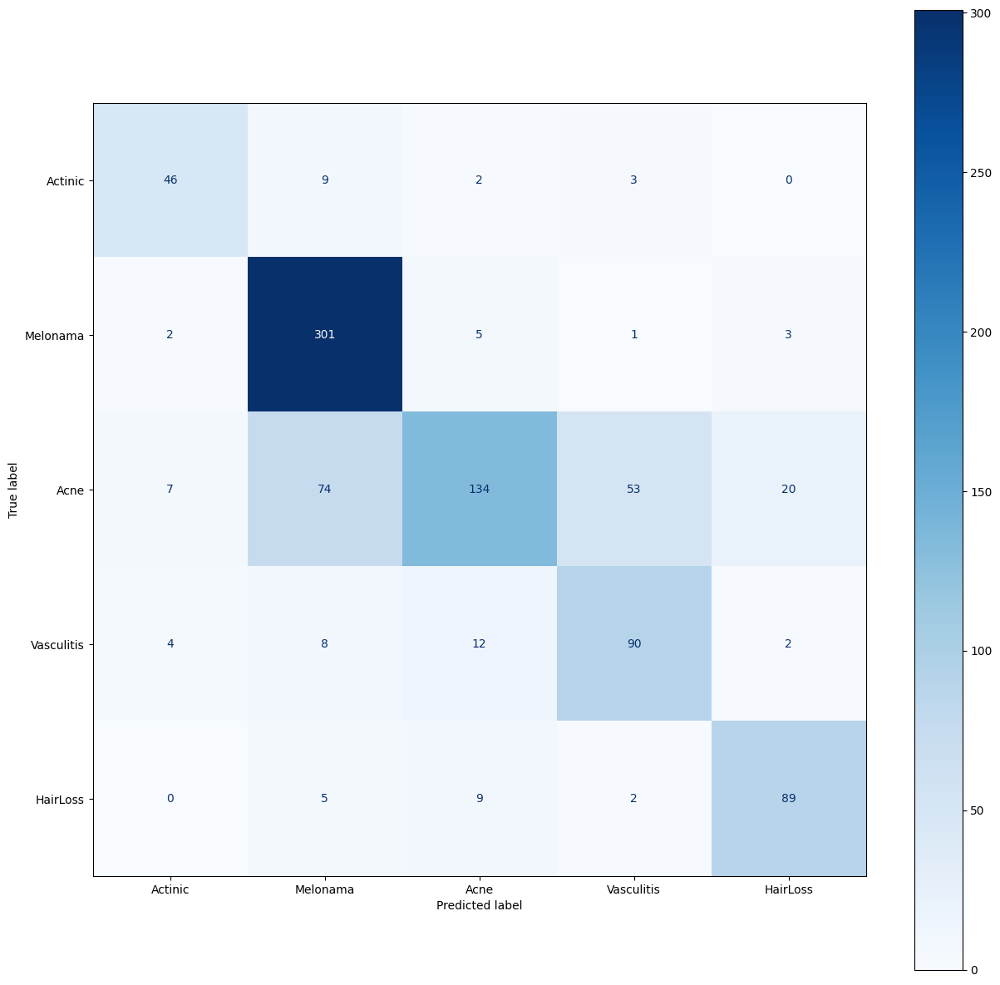

In [45]:
test_true=test_generator.classes
test_pred_raw = model.predict(test_generator)
test_pred = np.argmax(test_pred_raw, axis=1)

cm = confusion_matrix(test_true, test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Actinic','Melonama','Acne','Vasculitis','HairLoss'])
fig, ax = plt.subplots(figsize=(15,15))
disp.plot(ax=ax,cmap=plt.cm.Blues)
plt.show()

Model Accuracy

In [46]:
result = model.evaluate(test_generator,batch_size=32)
print("test_loss, test accuracy",result)

881/881 [==============================] - 7s 8ms/step - loss: 0.8358 - categorical_accuracy: 0.7491
test_loss, test accuracy [0.8357923626899719, 0.7491486668586731]


In [47]:
xp_preds = model.predict(test_generator)
xp_pred_classes = np.argmax(xp_preds, axis=1)

881/881 [==============================] - 6s 6ms/step


In [48]:
true_classes = test_generator.classes
class_indices = train_generator.class_indices
class_indices = dict((v,k) for k,v in class_indices.items())


xp_acc = accuracy_score(true_classes, xp_pred_classes)
print("Xception Model Accuracy: {:.2f}%".format(xp_acc * 100))

Xception Model Accuracy: 74.91%


# Model Save

In [49]:
from tensorflow.keras.models import load_model

In [50]:
model.save(os.path.join('models','New.h5'))

In [51]:
ImageModel = load_model('models/New.h5')

In [52]:
historyy = ImageModel.history


In [53]:
Normal = ["hairloss", "acne and rosacea", "melanoma skin cancer nevi and moles"]
Dangerous = ["actinic keratosis basal cell carcinoma", "vasculties"]

881/881 [==============================] - 6s 7ms/step


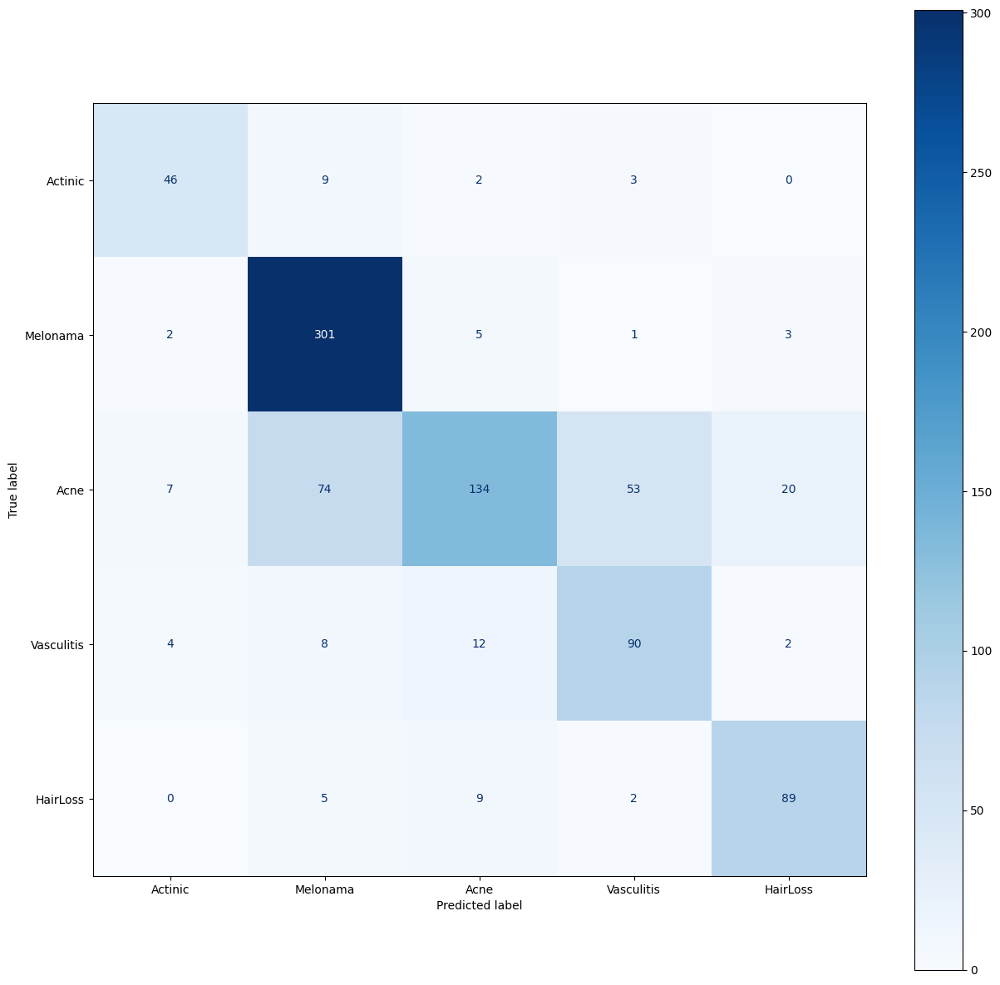

In [54]:
test_true=test_generator.classes
test_pred_raw = ImageModel.predict(test_generator)
test_pred = np.argmax(test_pred_raw, axis=1)

cm = confusion_matrix(test_true, test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Actinic','Melonama','Acne','Vasculitis','HairLoss'])
fig, ax = plt.subplots(figsize=(15,15))
disp.plot(ax=ax,cmap=plt.cm.Blues)
plt.show()

# Model Test

Test ImageModel

In [55]:
xp_preds = ImageModel.predict(test_generator)
xp_pred_classes = np.argmax(xp_preds, axis=1)
true_classes = test_generator.classes
class_indices = train_generator.class_indices
class_indices = dict((v,k) for k,v in class_indices.items())


xp_acc = accuracy_score(true_classes, xp_pred_classes)
print("Xception Model Accuracy: {:.2f}%".format(xp_acc * 100))

881/881 [==============================] - 6s 6ms/step
Xception Model Accuracy: 74.91%


Class Prediction Array

In [57]:
img = tf.keras.utils.load_img(
    'C:/Users/azizo/Desktop/a/test/Hair Loss Photos Alopecia and other Hair Diseases/telogen-effluvium-5.jpg',
    target_size=(224, 224)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = ImageModel.predict(img_array/224) #To split

predictions  #Prediction % for eacr diseas

1/1 [==============================] - 1s 515ms/step


array([[9.9797314e-01, 1.1421915e-03, 2.3033735e-04, 6.3845393e-04,
        1.5876220e-05]], dtype=float32)

Disease Prediction

In [58]:
score = tf.nn.softmax(predictions[0])

#class_names = list(train_generator.class_indices)
# train_generator.class_indices = {'HairLoss': 0, 'acne': 1, 'actinic': 2, 'melonama': 3, 'vasculitis': 4}
#Let's create a name list

namesDiseases = ["HairLoss", "Acne and Rosacea", "Actinic Keratosis Basal Cell Carcinoma", "Melanoma Skin Cancer Nevi and Moles","Vasculties"]
#Choose the most approch disease
print(
    "This image most likely belongs to '''{}''' with a {:.2f} percent confidence."
    .format(namesDiseases[np.argmax(score)], 100 * np.max(score) + 50)
)

#Search for disease
search_str = namesDiseases[np.argmax(score)].lower()
if search_str in Dangerous:
    print("-> It's a dangerous disease , You need to see a doctor")
elif search_str in Normal:
    print("-> It is not a serious disease, you can take your time")

This image most likely belongs to '''HairLoss''' with a 90.40 percent confidence.
-> It is not a serious disease, you can take your time


# For User

In [59]:
from keras.preprocessing import image
def predict_image(imagepath):

    img = tf.keras.utils.load_img(
    imagepath,
    target_size=(224, 224)
    )
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0) # Create a batch

    predictions = ImageModel.predict(img_array/255) #To split

    score = tf.nn.softmax(predictions[0])

    namesDiseases = ["HairLoss", "Acne and Rosacea", "Actinic Keratosis Basal Cell Carcinoma", "Melanoma Skin Cancer Nevi and Moles","Vasculties"]

    
    print(
    "This image most likely belongs to '''{}''' with a {:.2f} percent confidence."
    .format(namesDiseases[np.argmax(score)], 100 * np.max(score) + 50)
    )
     
    
    # for folder_name in our_folders:
    fig = plt.figure(1, figsize=(15, 15))
    grid = ImageGrid(fig, 111, nrows_ncols=(1, 1), axes_pad=0.05)
    ax = grid[0]
    img = tf.keras.utils.load_img(imagepath)
    img_array = tf.keras.utils.img_to_array(img)
    ax.imshow(img)
    
    
    ax.text(10, 150, 'Disease Name: %s' % namesDiseases[np.argmax(score)].upper(), color='k', backgroundcolor='w',\
    alpha=0.8, size = 20)
    
    
    search_str = namesDiseases[np.argmax(score)].lower()
    print(search_str)
    if search_str in Normal:
        ax.text(10, 200, 'It is not a serious disease, you can take your time', color='g', backgroundcolor='w',\
        alpha=0.8, size = 20)
    elif search_str in Dangerous:
        ax.text(10, 200, 'You need to see a doctor', color='g', backgroundcolor='w',\
        alpha=0.8, size = 20)
    
    
    
    ax.axis('off')
    plt.show()

1/1 [==============================] - 0s 21ms/step
This image most likely belongs to '''HairLoss''' with a 90.39 percent confidence.
hairloss


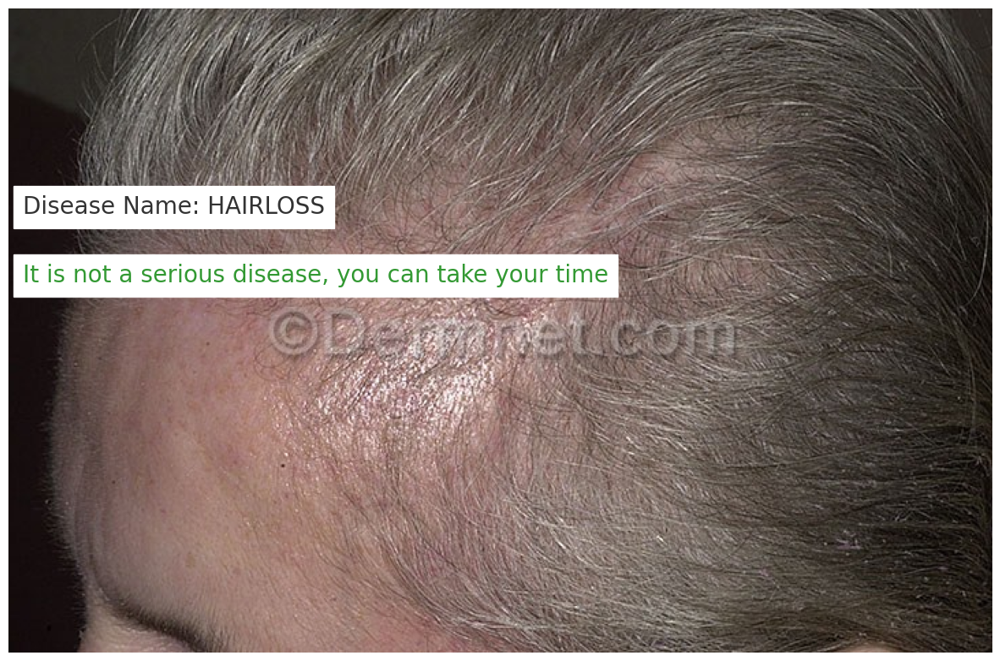

In [61]:
predict_image('C:/Users/azizo/Desktop/a/test/Hair Loss Photos Alopecia and other Hair Diseases/telogen-effluvium-5.jpg')

1/1 [==============================] - 0s 22ms/step
This image most likely belongs to '''Vasculties''' with a 80.87 percent confidence.
vasculties


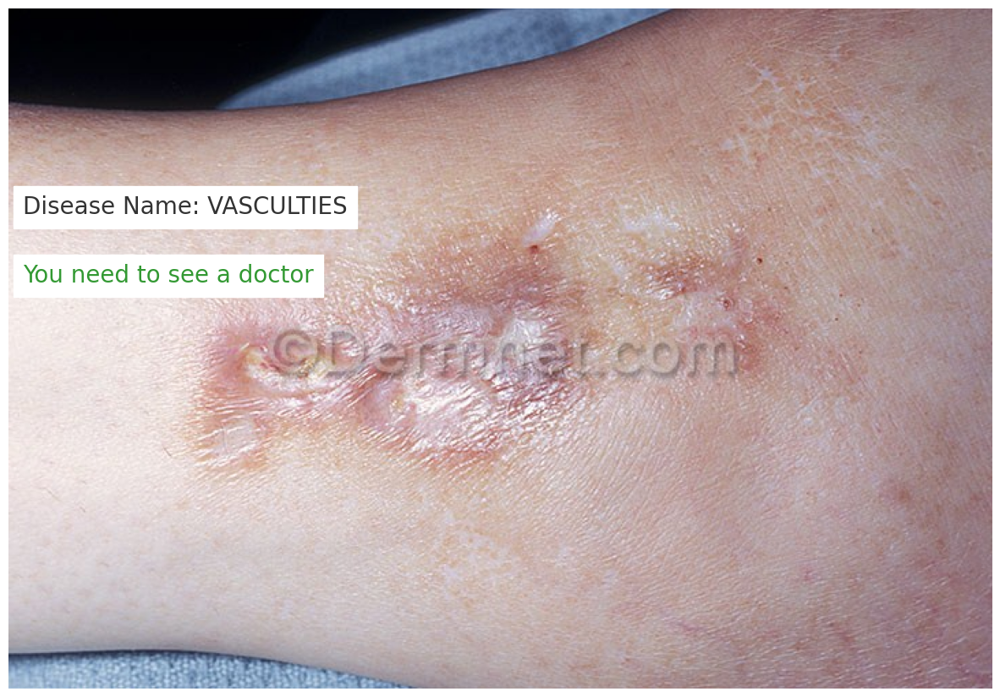

In [63]:
predict_image('C:/Users/azizo/Desktop/a/test/Vasculitis Photos/atrophy-blanche-4.jpg')

1/1 [==============================] - 0s 22ms/step
This image most likely belongs to '''Melanoma Skin Cancer Nevi and Moles''' with a 90.46 percent confidence.
melanoma skin cancer nevi and moles


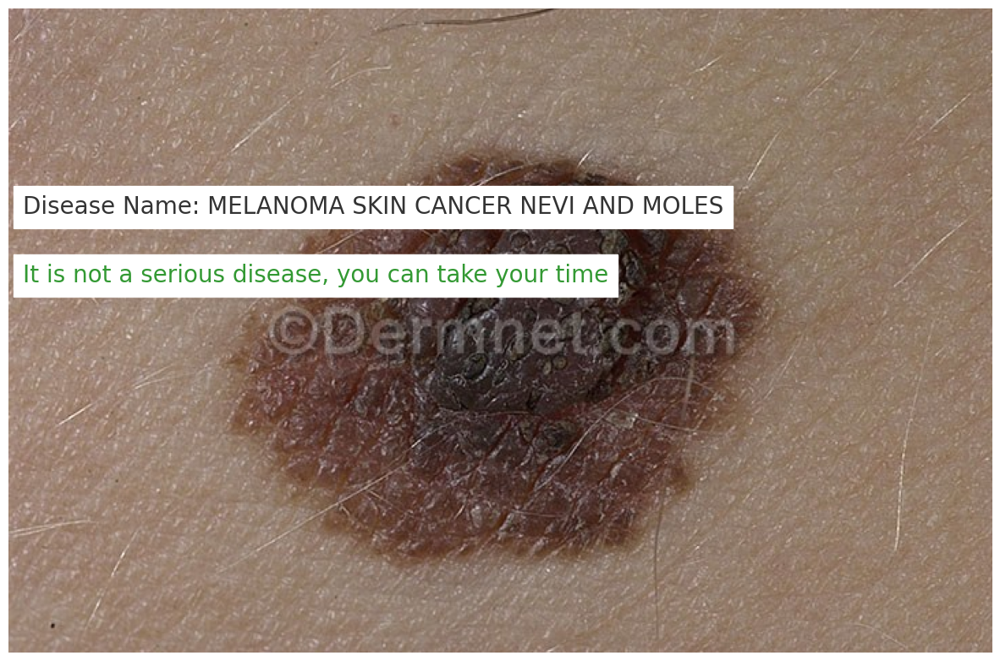

In [64]:
predict_image('C:/Users/azizo/Desktop/a/test/Melanoma Skin Cancer Nevi and Moles/atypical-nevi-23.jpg')

1/1 [==============================] - 0s 21ms/step
This image most likely belongs to '''Actinic Keratosis Basal Cell Carcinoma''' with a 89.21 percent confidence.
actinic keratosis basal cell carcinoma


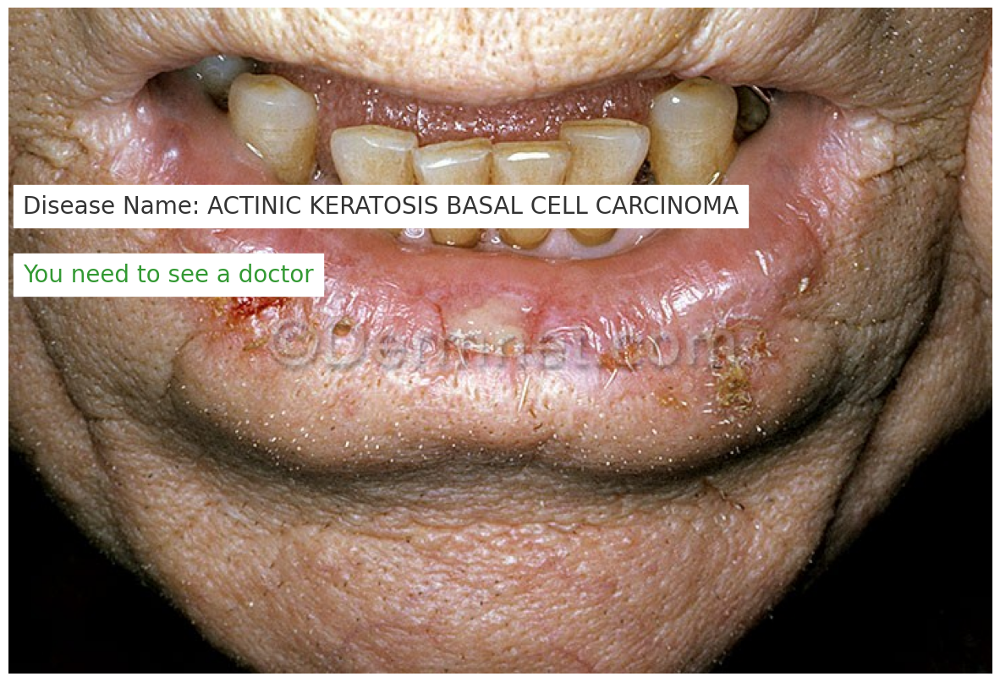

In [66]:
predict_image('C:/Users/azizo/Desktop/a/test/Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions/actinic-cheilitis-sq-cell-lip-9.jpg')

1/1 [==============================] - 0s 22ms/step
This image most likely belongs to '''Vasculties''' with a 90.41 percent confidence.
vasculties


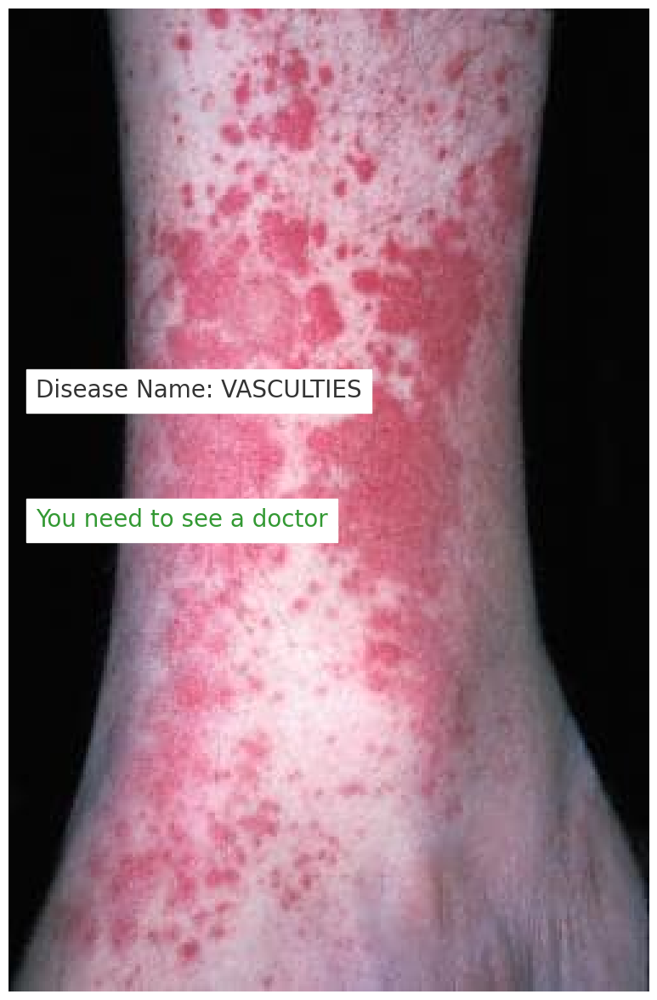

In [69]:
predict_image('C:/Users/azizo/Downloads/28385tn.jpg')

# Django Part

In [70]:
from joblib import dump
dump(ImageModel,'modelsDjango/SavedModel.job')

FileNotFoundError: [Errno 2] No such file or directory: 'modelsDjango/SavedModel.job'